# Drugi domaći zadatak iz predmeta 13E044DOS - Digitalna obrada slike
<hr>
<p style="font-size:20px">Viktor Todosijević 0050/2017</p>

Automatsko numerisanje jednačina

In [304]:
%%javascript
MathJax.Hub.Config({
    TeX: { equationNumbers: { autoNumber: "AMS" } }
});

<IPython.core.display.Javascript object>

In [305]:
from IPython.display import display, HTML
import numpy as np
from matplotlib import pyplot as plt
from skimage import io
import cv2

In [306]:
display(HTML("""
<style>
.output {
    display: flex;
    align-items: center;
    text-align: center;
}
</style>
"""))

## Učitavanje
<hr>

In [307]:
test_frames = []
file_name = 'test'
extension = '.jpg'

for i in range(1, 7):
    img = io.imread('sekvence/test_frames/' + file_name + str(i) + extension)
    test_frames.append(img)
    

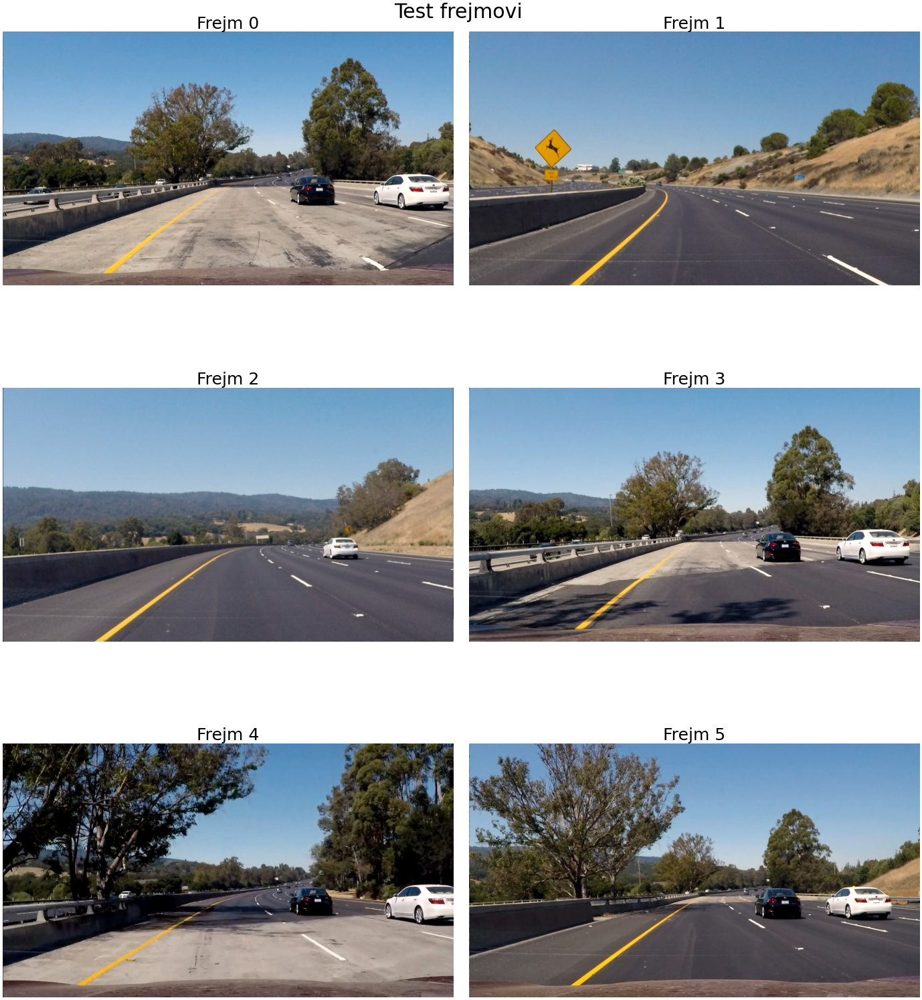

In [308]:
subplot_figsize = (35,40)
title_fontsize = 45
suptitle_fontsize = 1.2 * title_fontsize
    
fig, ax = plt.subplots(len(test_frames) // 2, 2, figsize=subplot_figsize, dpi=40);
plt.tight_layout()

for i, frame in enumerate(test_frames):
    ax[i // 2, i % 2].imshow(frame)
    ax[i // 2, i % 2].axis('off')
    ax[i // 2, i % 2].set_title("Frejm " + str(i), fontsize=title_fontsize)
    
fig.suptitle("Test frejmovi", fontsize=suptitle_fontsize)

plt.show()

## Segmentacija
<hr>

In [309]:
def segment_lanes(img):
    white = (255, 255, 245)
    whiteish = (240, 220, 210)
    yellow = (200, 170, 0)
    yellowish = (255, 255, 140)

    kernel_closing = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (19, 19))
    kernel_dilation = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))

    mask_yellow = cv2.inRange(img, yellow, yellowish)
    mask_white = cv2.inRange(img, whiteish, white)
    merged_mask = mask_white | mask_yellow
    closing = cv2.morphologyEx(merged_mask, cv2.MORPH_CLOSE, kernel_closing)
    dilation = cv2.dilate(closing, kernel_dilation, iterations=1)

    return dilation, closing, merged_mask, mask_white, mask_yellow

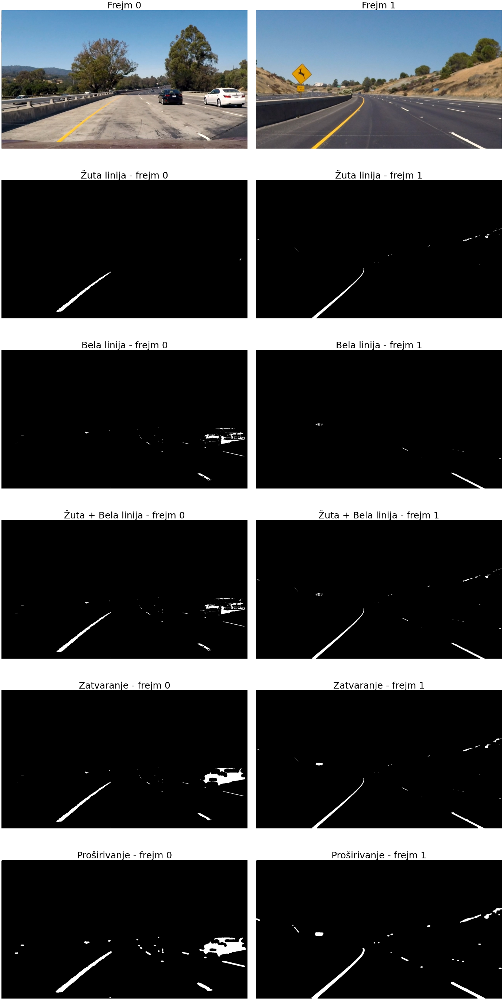

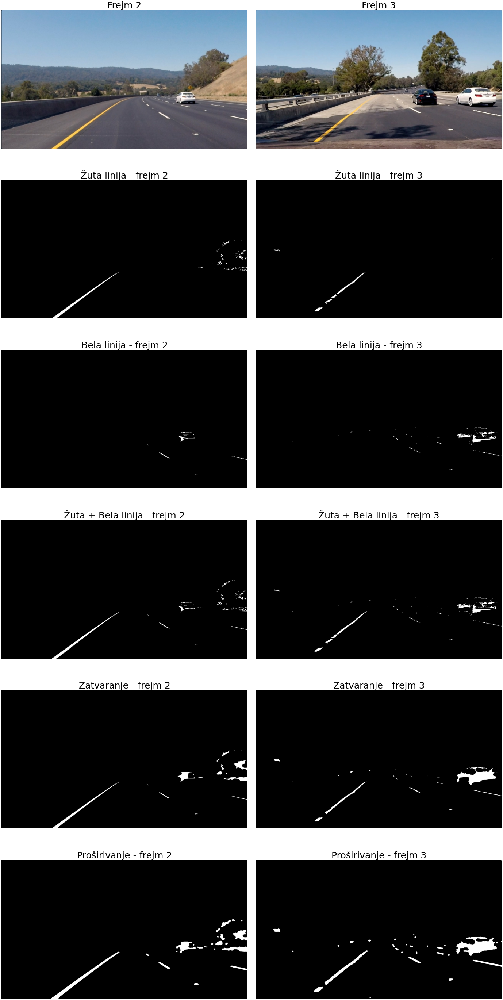

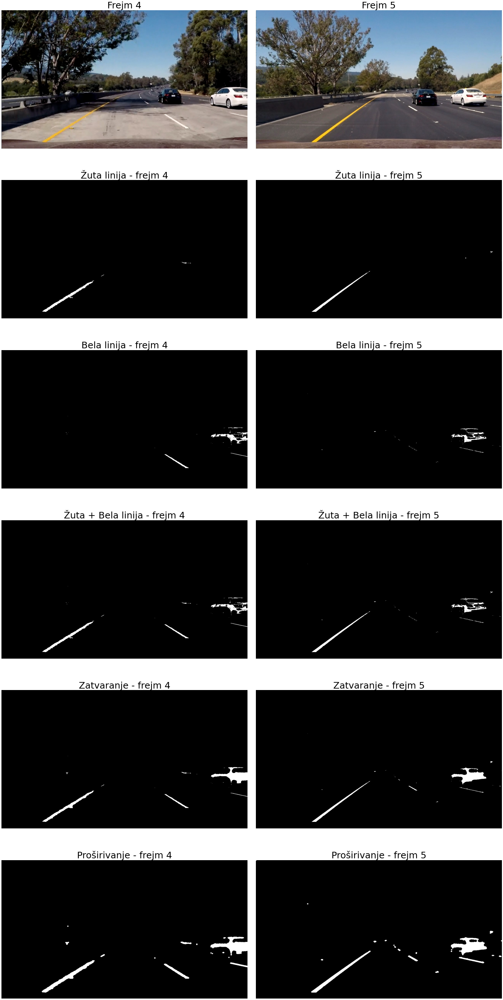

In [310]:

subplot_figsize = (35,70)
title_fontsize = 45
suptitle_fontsize = 1.2 * title_fontsize
mask_names = ["Proširivanje", "Zatvaranje", "Žuta + Bela linija", "Bela linija", "Žuta linija"]

canny_inputs = []
for k in range(len(test_frames) // 2):
    fig, ax = plt.subplots(5 + 1, 2, figsize=subplot_figsize, dpi=40);
    plt.tight_layout()
    for i in range(2):
        frame_num = 2 * k + i
        frame = test_frames[frame_num]
        masks = segment_lanes(frame)
        
        # dilation kao input canny-ja
        canny_inputs.append(masks[0])

        ax[0, i % 2].imshow(frame)
        ax[0, i % 2].axis('off')
        ax[0, i % 2].set_title("Frejm " + str(frame_num), fontsize=title_fontsize)
        for j in range(len(masks)):
            ax[j + 1, i % 2].imshow(masks[::-1][j], cmap='gray')
            ax[j + 1, i % 2].axis('off')
            ax[j + 1, i % 2].set_title(mask_names[::-1][j] + " - frejm " + str(frame_num), fontsize=title_fontsize)


## Izdvajanje ivica - Canny-jev algoritam
<hr>

In [311]:
def canny_edge_detection(canny_input, threshold_low, threshold_high):
    gauss_kernel_size = 5
    img_filtered = cv2.GaussianBlur(canny_input, (gauss_kernel_size, gauss_kernel_size), 0)

    sobel_kernel_size = 3
    sobelx = cv2.Sobel(img_filtered, cv2.CV_64F, 1, 0, ksize=sobel_kernel_size)
    sobely = cv2.Sobel(img_filtered, cv2.CV_64F, 0, 1, ksize=sobel_kernel_size)

    sobel_ampsqr = sobelx ** 2 + sobely ** 2
    sobel_ampsqr = sobel_ampsqr / np.amax(sobel_ampsqr)
    edges = sobel_ampsqr
    sobel_angle = np.arctan2(sobely, sobelx) / np.pi * 180

    bins = np.array([-200, -157.5, -112.5, -67.5, -22.5, 22.5, 67.5, 112.5, 157.5, 200])
    # digitize ce vratiti od 1 do 9 pa -5 je od -4 do 4 pa puta 45 je od -180 do 180 diskretno
    sobel_angle_discrete = (np.digitize(sobel_angle, bins) - 5) * 45
    sobel_angle_discrete[sobel_angle_discrete == -180] = 0
    sobel_angle_discrete[sobel_angle_discrete == 180] = 0
    sobel_angle_discrete[sobel_angle_discrete == -135] = 45
    sobel_angle_discrete[sobel_angle_discrete == -90] = 90
    sobel_angle_discrete[sobel_angle_discrete == -45] = 135

    row_idxs, col_idxs = np.nonzero(edges)
    
    # potiskivanje lokalnih nemaksimuma
    for cnt in range(len(row_idxs)):
        i = row_idxs[cnt]
        j = col_idxs[cnt]
        # provera da nismo kod ivica
        if i == 0 or j == 0 or i == edges.shape[0] - 1 or j == edges.shape[1] - 1:
            edges[i, j] = 0
            continue

        # vertikalna ivica -> horizontalno susedstvo
        if sobel_angle_discrete[i, j] == 0:
            if edges[i, j] != max(edges[i, j - 1], edges[i, j], edges[i, j + 1]):
                edges[i, j] = 0

        # ivica u desno po 45 -> susedstvo u levo po 45
        if sobel_angle_discrete[i, j] == 45:
            if edges[i, j] != max(edges[i - 1, j - 1], edges[i, j], edges[i + 1, j + 1]):
                edges[i, j] = 0

        # horizontalna ivica -> vertikalno susedstvo
        if sobel_angle_discrete[i, j] == 90:
            if edges[i, j] != max(edges[i - 1, j], edges[i, j], edges[i + 1, j]):
                edges[i, j] = 0

        # ivica u levo po 45 -> susedstvo u desno po 45
        if sobel_angle_discrete[i, j] == 135:
            if edges[i, j] != max(edges[i + 1, j - 1], edges[i, j], edges[i - 1, j + 1]):
                edges[i, j] = 0

    edges[edges > threshold_high] = 1
    edges[edges < threshold_low] = 0

    row_idxs, col_idxs = np.nonzero(edges)

    # slabe ivice
    for cnt in range(len(row_idxs)):
        i = row_idxs[cnt]
        j = col_idxs[cnt]
        # provera da nismo kod ivica
        if i == 0 or j == 0 or i == edges.shape[0] - 1 or j == edges.shape[1] - 1:
            edges[i, j] = 0
            continue

        if edges[i, j] == 1:
            continue

        neighbourhood = edges[i - 1:i + 2, j - 1:j + 2]
        if neighbourhood[neighbourhood == 1].size > 0:
            edges[i, j] = 1
        else:
            edges[i, j] = 0

    return edges, sobel_ampsqr, sobel_angle, sobel_angle_discrete


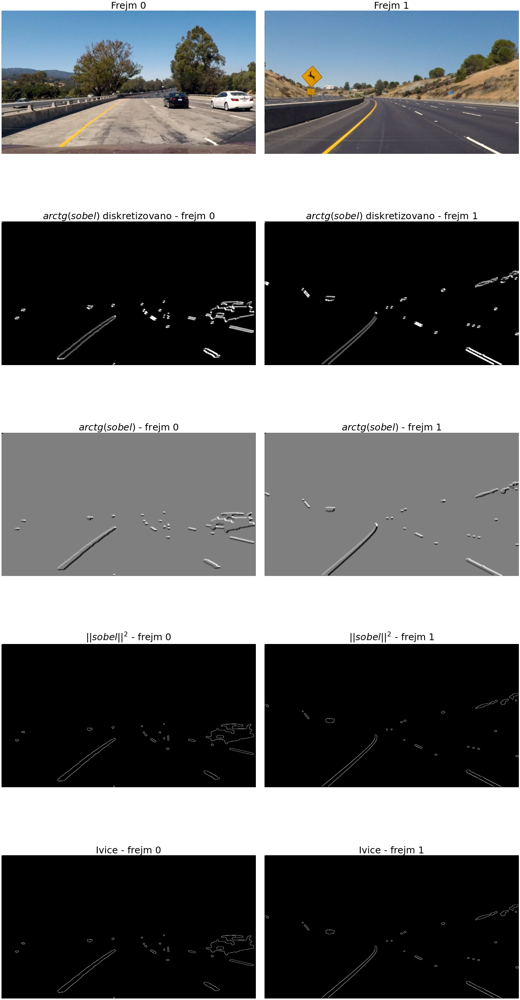

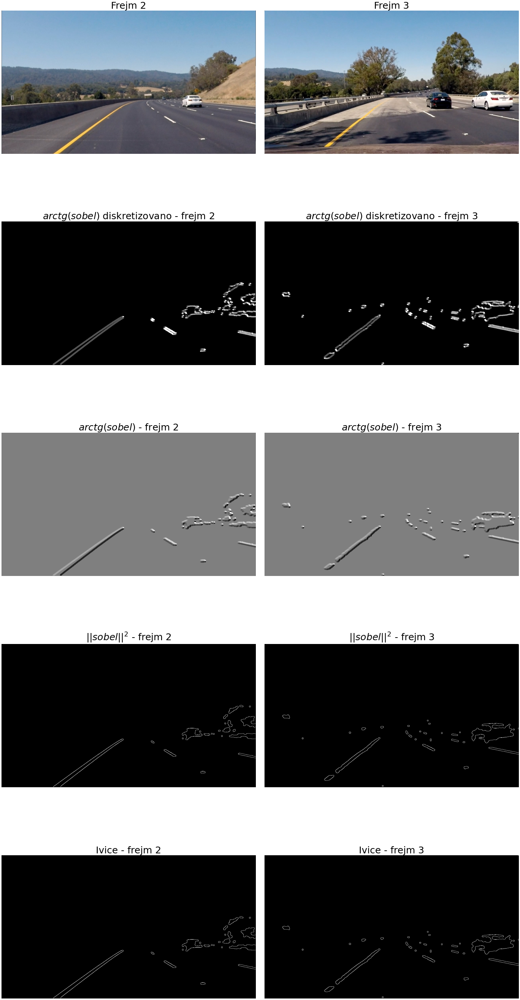

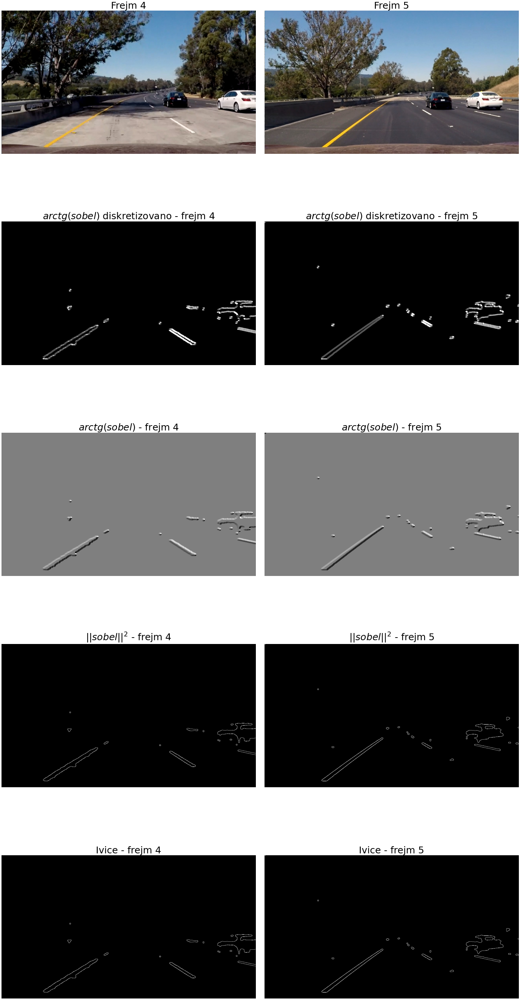

In [312]:
subplot_figsize = (35,70)
title_fontsize = 45
suptitle_fontsize = 1.2 * title_fontsize
step_names = ["Ivice", "$||sobel||^2$", "$arctg(sobel)$", "$arctg(sobel)$ diskretizovano"]

threshold_low = 0.3
threshold_high = 0.6


for k in range(len(test_frames) // 2):
    fig, ax = plt.subplots(4 + 1, 2, figsize=subplot_figsize, dpi=40);
    plt.tight_layout()
    for i in range(2):
        frame_num = 2 * k + i
        frame = test_frames[frame_num]
        canny_steps = canny_edge_detection(canny_inputs[frame_num], threshold_low, threshold_high)

        ax[0, i % 2].imshow(frame)
        ax[0, i % 2].axis('off')
        ax[0, i % 2].set_title("Frejm " + str(frame_num), fontsize=title_fontsize)
        for j in range(len(canny_steps)):
            ax[j + 1, i % 2].imshow(canny_steps[::-1][j], cmap='gray')
            ax[j + 1, i % 2].axis('off')
            ax[j + 1, i % 2].set_title(step_names[::-1][j] + " - frejm " + str(frame_num), fontsize=title_fontsize)

Apdejtovanje numerisanja jednačina

In [313]:
%%javascript
MathJax.Hub.Queue(
  ["resetEquationNumbers", MathJax.InputJax.TeX],
  ["PreProcess", MathJax.Hub],
  ["Reprocess", MathJax.Hub]
);

<IPython.core.display.Javascript object>